# Image Processing using Opencv and GDAL



1.   Geometric Transformation
2.   Intensity Transformation
3.   Morphological Transformation
4.   Spatial Filtering



# Digital Image


A Digital/Raster Image is represented as an array of real numbers.  

In Image  the x- and y-axis are used to denote the rows and columns of the array.


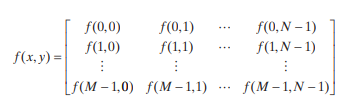


# Neighbors of a Pixel



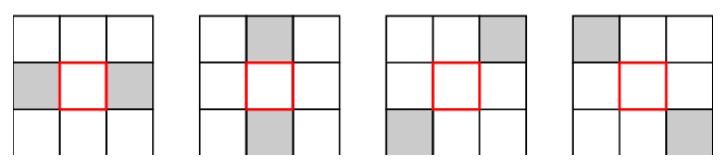

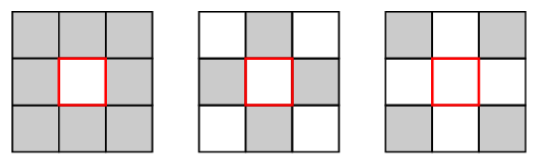

# Spatial Operations
Spatial operations are performed directly on the pixels of an image.
Spatial operations into three broad categories.


1.   Single Pixel Operations or Local Operations
2.   Neighborhood Operations or Focal operations
3.   Geometric Spatial Transformations



# Single-Pixel Operations

The vaue of pixel in output image is determined by a specified operation on pixel in input image.
The simplest operation we perform on a digital image is to alter the intensity of its  pixels individually using a transformation function, T, of the form.  
s = T(z)

Example: NDVI Calculation

# Neighborhood Operation
The value of pixel in output image determined by a specified
operation on the neighborhood of pixels in the input image.

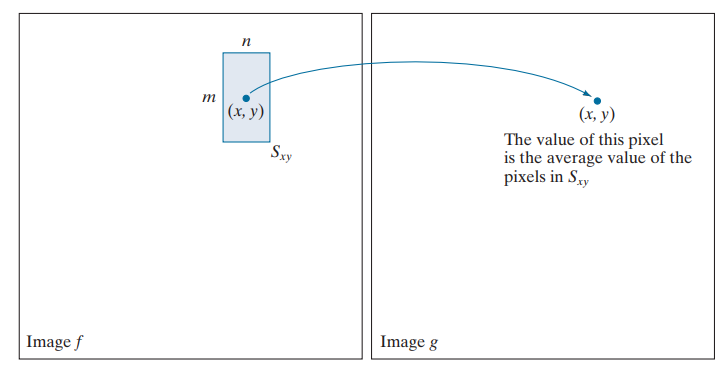

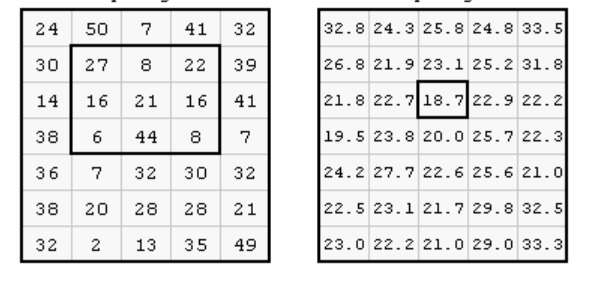

# Geometric Transformation

Geometric transformations modify the spatial arrangement of pixels in an
image. These transformations are called **rubber-sheet** transformations because they may be viewed as analogous to **printing** an image on a rubber sheet, then stretching or shrinking the sheet according to a predefined set of rules.

The Transformation is expressed as

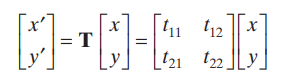

For example, the
transformation (x') ( y' )  = (x/2, y/2) shrinks the original image to half its size in both
spatial directions

it is possible to use homogeneous matrix  to express scaling, translation,
rotation, and shearing transformations

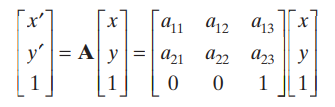

# Scaling
Scaling is just resizing of the image. The transformation moves the coordinates of pixels in an image to new locations. New Intensity values need to be assigned to those locations. This task is accomplished using intensity interpolation.

Most common interpolation techniques are **nearest neighbor, bilinear, and bicubic interpolation** .

**Nearest Neighbor**- assigns to each new location the intensity of its nearest neighbor in the original image  
**Bilinear Interpolation**- it uses the four
nearest neighbors to estimate the intensity at a given location.  
**Bicubic Interpolation**-it uses the sixteen
nearest neighbors to estimate the intensity at a given location.

# OpenCV
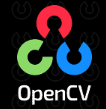

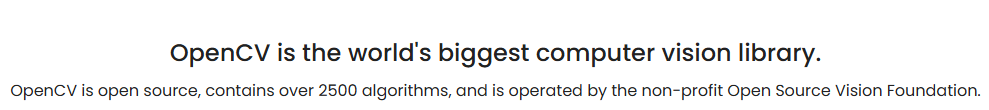

OpenCV (Open Source Computer Vision Library: http://opencv.org) is an open-source library that includes several hundreds of computer vision algorithms.  
OpenCV provides tools for image processing, video capture and analysis, camera calibration, feature detection, object detection, machine learning, and more. It supports multiple programming languages including C++, Python, Java, and MATLAB.  

OpenCV is widely used in various fields such as robotics, augmented reality, facial recognition, gesture recognition, medical imaging, autonomous vehicles, and more.


# Scaling
Scaling is just resizing of the image. OpenCV comes with a function cv.resize() for this purpose. The size of the image can be specified manually, or you can specify the scaling factor. Different interpolation methods are used. Preferable interpolation methods are cv.INTER_AREA for shrinking and cv.INTER_CUBIC (slow) & cv.INTER_LINEAR for zooming. By default, the interpolation method cv.INTER_LINEAR is used for all resizing purposes. You can resize an input image with either of following methods:

In [ ]:
from osgeo import gdal
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

In [ ]:
os.chdir(r'/content/drive/MyDrive/DLP_Data')

In [ ]:
file_name = 'BAND4.tif'

In [ ]:
ds = gdal.Open(file_name)

In [ ]:
img = ds.ReadAsArray()

In [ ]:
img.shape

(2000, 2000)

In [ ]:
res = cv.resize(img, None,fx=0.1, fy=0.1, interpolation = cv.INTER_CUBIC)

In [ ]:
res.shape

(200, 200)

Text(0.5, 1.0, 'Scaled Iamge')

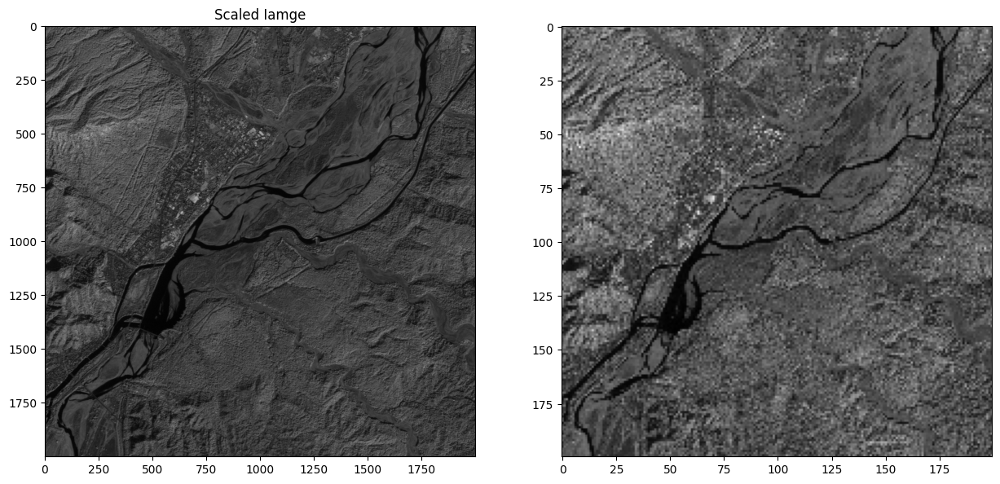

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Iamge')
axs[1].imshow(res, cmap='gray')
axs[0].set_title('Scaled Iamge')


In [ ]:
plt.close()

# Translation
Translation is the shifting of an object's location.
If we  know the shift in the (x,y) direction and let it be
tx ty  then transformation matrix will be as follows:



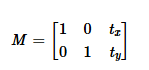

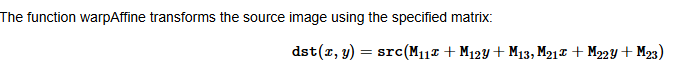

In [ ]:
M = np.float32([[1,0,0],[0,1,500]])

In [ ]:
rows,cols = img.shape

In [ ]:
dst = cv.warpAffine(img,M,(cols,rows))

Text(0.5, 1.0, 'Translated Iamge')

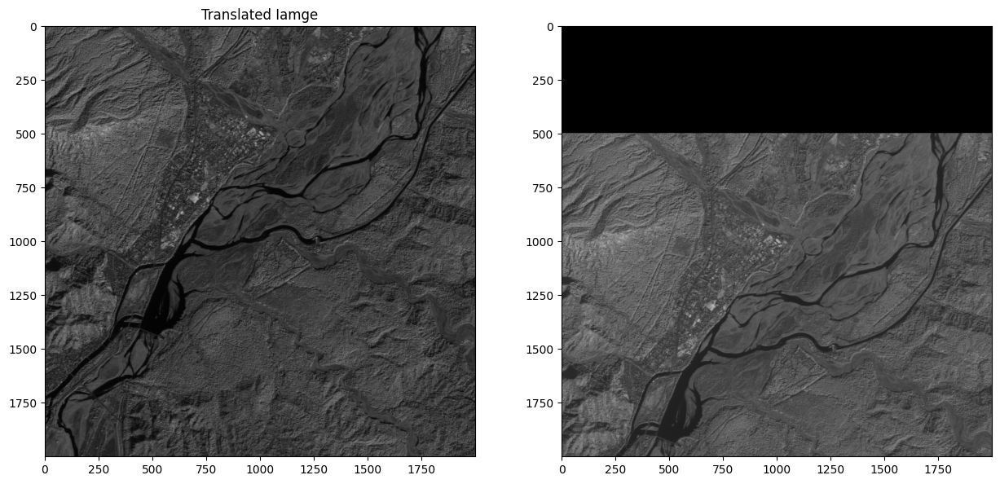

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Iamge')
axs[1].imshow(dst, cmap='gray')
axs[0].set_title('Translated Iamge')


In [ ]:
plt.close()

# Rotation
Rotation of an image for an angle image.png  achieved by the transformation matrix of the form

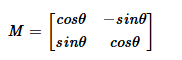

But OpenCV provides scaled rotation with adjustable center of rotation so that you can rotate at any location you prefer. The modified transformation matrix is given by

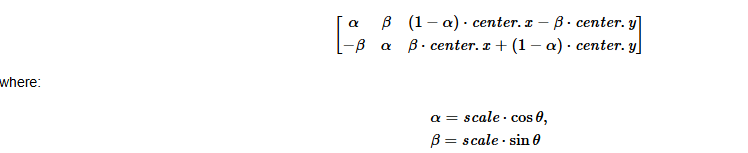

below example which rotates the image by 90 degree with respect to center without any scaling.

In [ ]:
M = cv.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),-30,1)

In [ ]:
M

array([[ 8.66025404e-01, -5.00000000e-01,  6.33657609e+02],
       [ 5.00000000e-01,  8.66025404e-01, -3.65842391e+02]])

In [ ]:
dst = cv.warpAffine(img,M,(cols,rows))

Text(0.5, 1.0, 'Rotated Iamge')

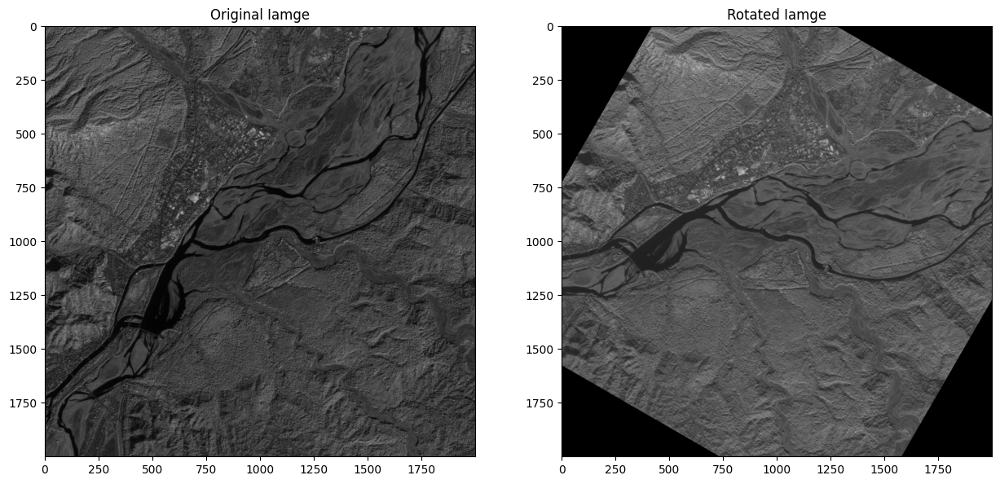

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Iamge')
axs[1].imshow(dst, cmap='gray')
axs[1].set_title('Rotated Iamge')

In [ ]:
plt.close()
del ds

# Image Intensity Transformation or image Enhancement

The term **spatial domain** refers to the image plane itself, and image processing methods in this category
are based on direct manipulation of pixels in an image.

Two principal categories of spatial processing are **intensity transformations and spatial filtering**.  
**Intensity transformations** operate on single pixels of an image for tasks such
as contrast manipulation and image thresholding.   
**Spatial filtering** performs operations on the neighborhood of every pixel in an image

**Contrast** in an image is defined as the difference in luminance or color that makes an object distinguishable from other objects within the same field of view1. Essentially, it is the range between the brightest and darkest parts of an image

**Enhancement** is the process of manipulating an image so that the
result is more suitable than the original for a specific application. The word specific
is important, because it establishes at the outset that enhancement techniques are
problem-oriented. Thus, for example, a method that is quite useful for enhancing
X-ray images may not be the best approach for enhancing infrared images.  
When an image is processed for visual
interpretation, the viewer is the ultimate judge of how well a particular method  works.

Regardless of the application or method used, image enhancement
is one of the most visually appealing areas of image processing

# Basic Intensity Transformations

Intensity transformations are among the simplest of all image processing techniques.
3 basic types of functions used frequently in image processing:   
**linear** (negative and identity transformations)  
**logarithmic** (log and inverse-log transformations)  
**power-law** (nth power and nth root transformations)

# Image Negatives

The negative of an image with intensity levels in the range [0, L-1] is obtained by
using the negative transformation function   
s = L - 1 - r

Reversing the intensity levels of a digital image in this manner produces the
equivalent of a photographic negative. This type of processing is used, for example, in enhancing white or gray detail embedded in dark regions of an image, especially when the black areas are dominant in size.

In [ ]:
file_name = 'BAND4.tif'
ds = gdal.Open(file_name)

In [ ]:
img = ds.ReadAsArray()

In [ ]:
img.max()

np.uint16(306)

In [ ]:
negative_img = img.max() - img

Text(0.5, 1.0, 'Negative Iamge')

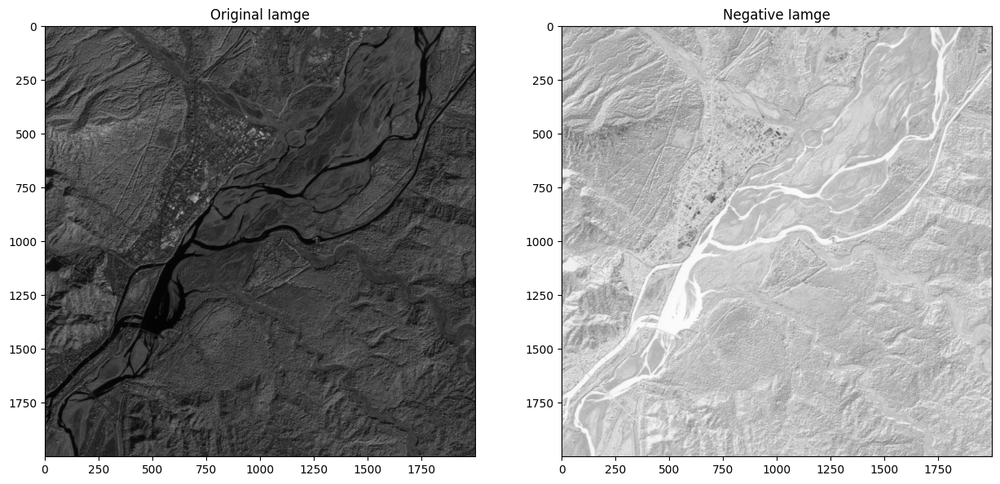

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Iamge')
axs[1].imshow(negative_img, cmap='gray')
axs[1].set_title('Negative Iamge')

In [ ]:
plt.close()

# LOG TRANSFORMATIONS

s= clog(1+r)

where c is constant and r is assumed >0

In [ ]:
log_img = 1 * np.log( 1 + img)

Text(0.5, 1.0, 'Log Image')

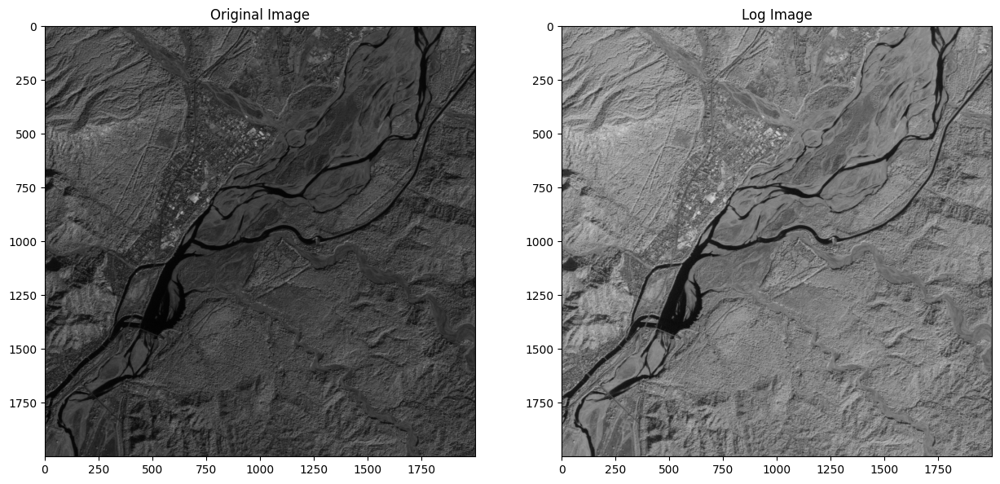

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(log_img, cmap='gray')
axs[1].set_title('Log Image')

# POWER-LAW (GAMMA) TRANSFORMATIONS

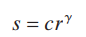

Power-law curves with fractional values of gamma map
a narrow range of dark input values into a wider range of output values, with the opposite being true for higher values of input levels.

In [ ]:
plt.close()

In [ ]:
power_img = 1 * np.power(img, 0.01)

Text(0.5, 1.0, 'Power Image')

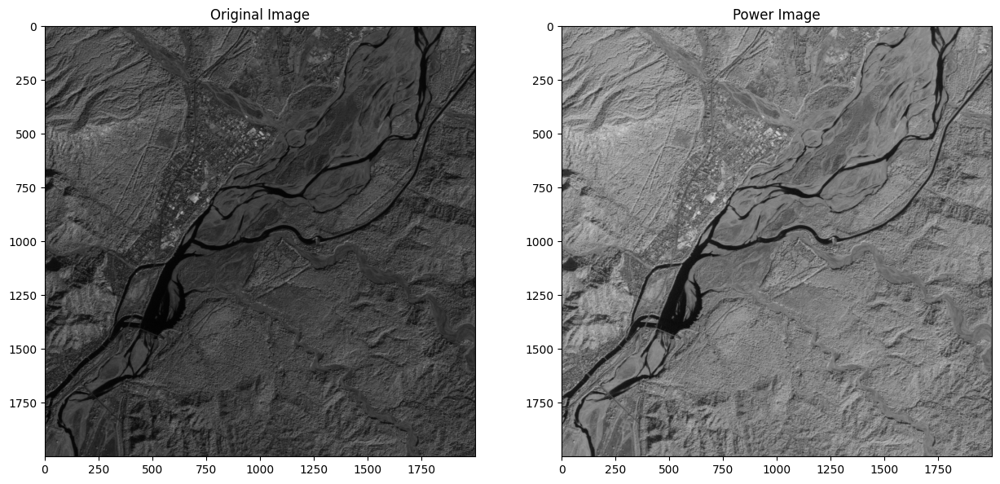

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(power_img, cmap='gray')
axs[1].set_title('Power Image')

In [ ]:
ds = gdal.Open('/content/drive/MyDrive/DLP_Data/washed_image.jpg')

In [ ]:
data = ds.ReadAsArray(band_list=[1])

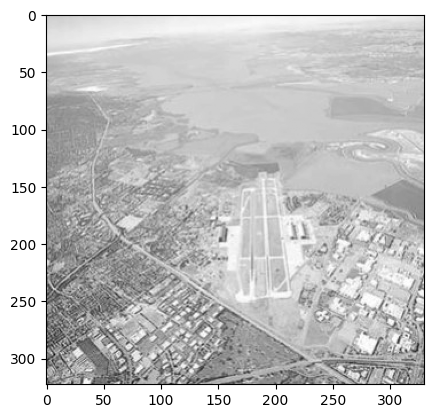

In [ ]:
plt.imshow(data, cmap='gray')

In [ ]:
plt.close()

a washed-out appearance, indicating that a compression of intensity levels is desirable

In [ ]:
power_img_3 = 1 * np.power(data, 3.)
power_img_4 = 1 * np.power(data, 4.)
power_img_5 = 1 * np.power(data, 5.)


Text(0.5, 1.0, 'Gamma-5')

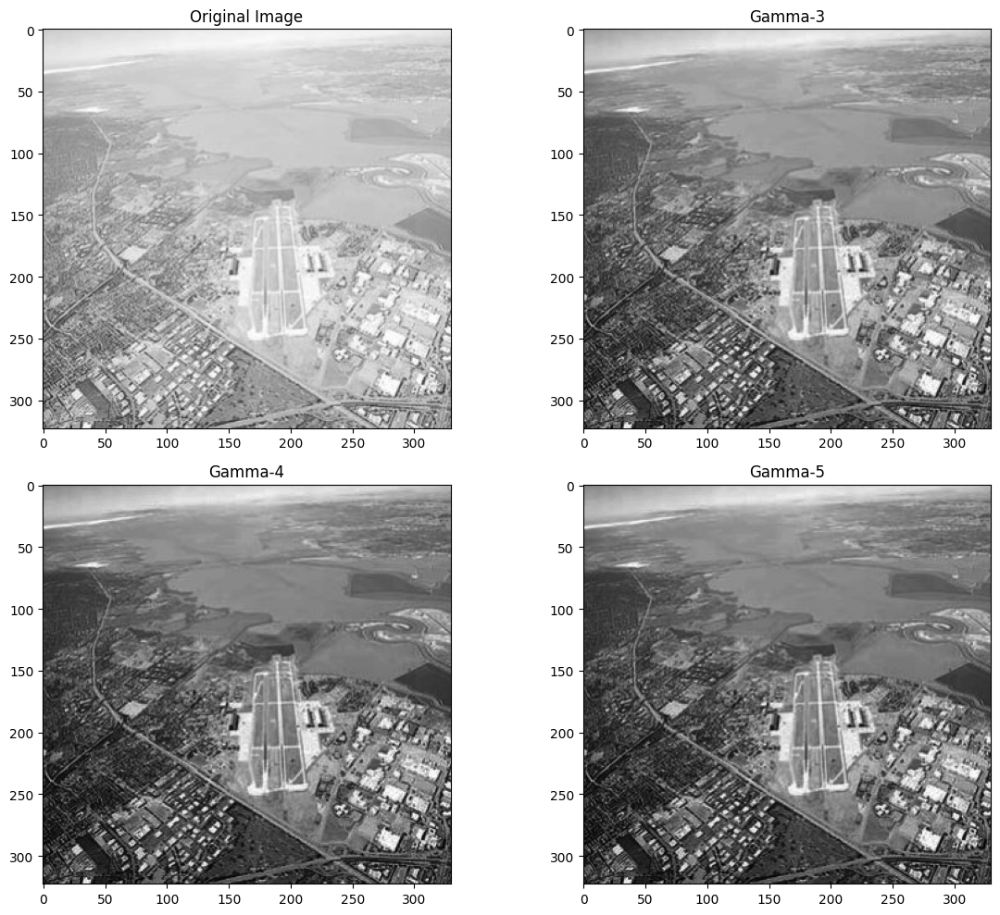

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10))
fig.set_tight_layout(True)
axs[0, 0].imshow(data, cmap='gray')
axs[0, 0].set_title('Original Image')

axs[0, 1].imshow(power_img_3, cmap='gray')
axs[0, 1].set_title('Gamma-3')

axs[1, 0].imshow(power_img_4, cmap='gray')
axs[1, 0].set_title('Gamma-4')

axs[1, 1].imshow(power_img_4, cmap='gray')
axs[1, 1].set_title('Gamma-5')

In [ ]:
plt.close()

# Thresholding
Thresholding in digital image processing is a technique used to segment images by converting grayscale images into binary images. This process involves setting a threshold value and classifying each pixel based on whether its intensity is above or below this threshold.  
For every pixel, the same threshold value is applied. If the pixel value is smaller than or equal to the threshold, it is set to 0, otherwise it is set to a maximum value

In [ ]:
green_data = gdal.Open('BAND2.tif').ReadAsArray() * 1.
nir_data = gdal.Open('BAND4.tif').ReadAsArray() * 1.

In [ ]:
ndwi = (green_data - nir_data) / (green_data + nir_data)

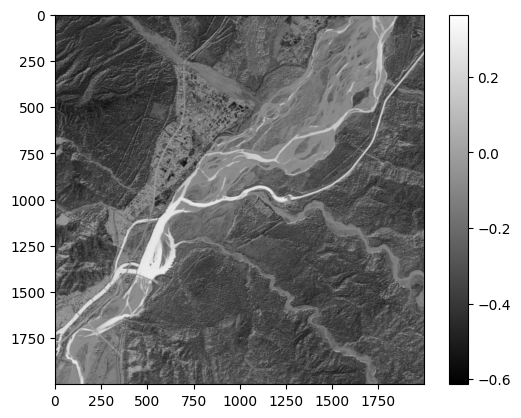

In [ ]:
plt.imshow(ndwi, cmap='gray')
plt.colorbar()

In [ ]:
ret,th1 = cv.threshold(ndwi,0.1,255,cv.THRESH_BINARY)

Text(0.5, 1.0, 'Binary Image')

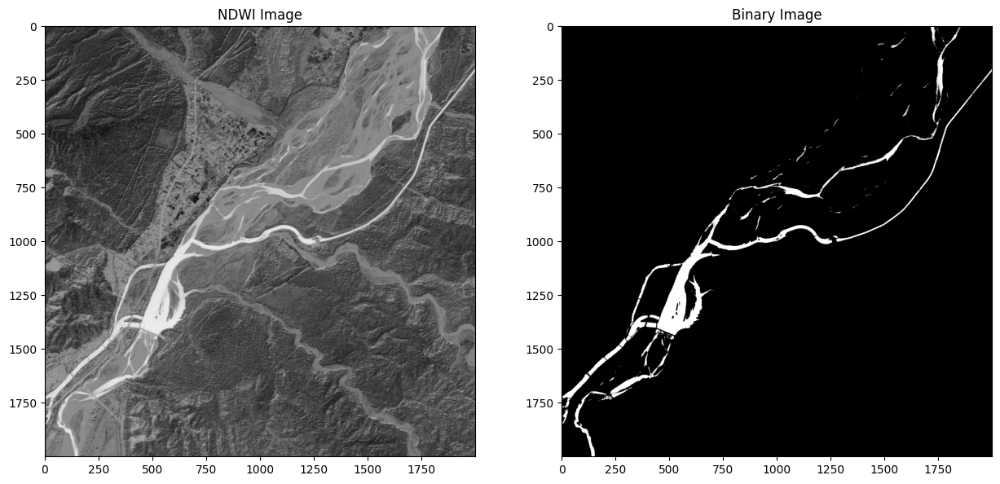

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
axs[0].imshow(ndwi, cmap='gray')
axs[0].set_title('NDWI Image')
axs[1].imshow(th1, cmap='gray')
axs[1].set_title('Binary Image')

In [ ]:
plt.close()

# Contrast Stretching

Low-contrast images can result from poor illumination, lack of dynamic range in the
imaging sensor, or even the wrong setting of a lens aperture during image acquisition. Contrast stretching expands the range of intensity levels in an image so that it
spans the ideal full intensity range of the recording medium or display device

In [ ]:
file_name = 'BAND3.tif'
ds = gdal.Open(file_name)

In [ ]:
img = ds.ReadAsArray()
img = img.clip(0, 100)

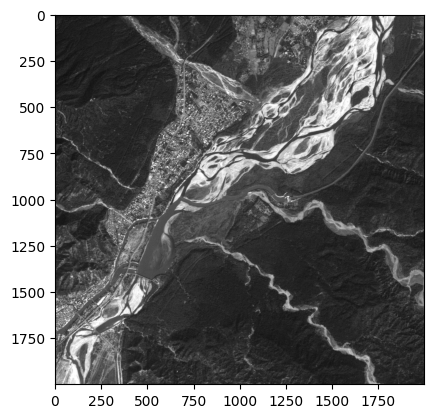

In [ ]:
plt.imshow(img, cmap='gray')

/tmp/ipython-input-3269869568.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img.ravel(),256,[0,256])


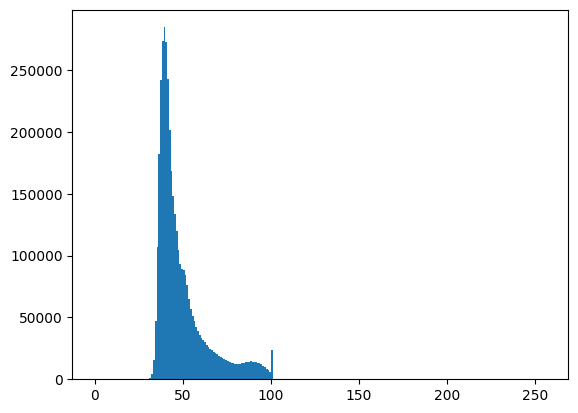

In [ ]:
plt.hist(img.ravel(),256,[0,256])
plt.show()

In [ ]:
min_val = np.min(img)
max_val = np.max(img)

    # Apply contrast stretching
stretched_image = (img - min_val) * (255 / (max_val - min_val))
stretched_image = stretched_image.astype(np.uint8)

/tmp/ipython-input-237404442.py:1: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(stretched_image.ravel(),256,[0,256]); plt.show()


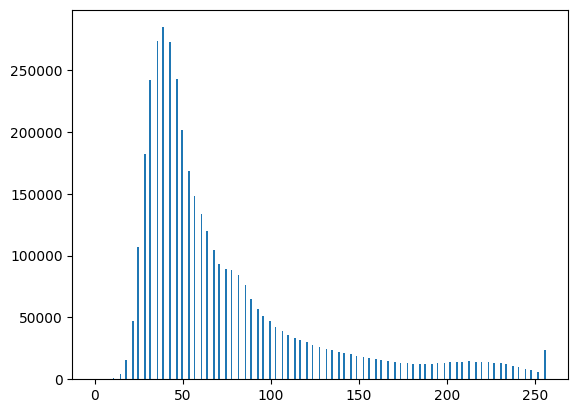

In [ ]:
plt.hist(stretched_image.ravel(),256,[0,256]); plt.show()

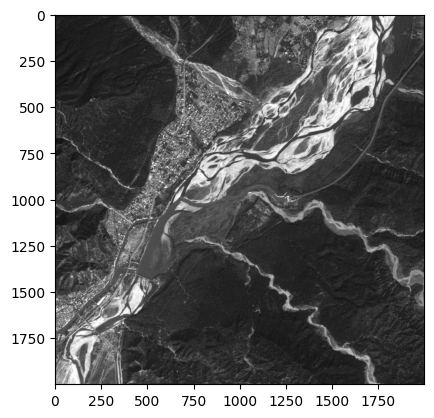

In [ ]:
plt.imshow(stretched_image, cmap='gray')

# Histogram Equalisation

Histogram Equalization is a  contrast enhancement technique that redistributes the intensity values of an image so that the histogram becomes more uniform.
Histogram equalization produces a transformation
function that seeks to generate an output image with a uniform histogram. When automatic enhancement is desired, this is a good approach to consider.    
Consider an image whose pixel values are confined to some specific range of values only. For eg, brighter image will have all pixels confined to high values. But a good image will have pixels from all regions of the image. So you need to stretch this histogram to either ends (as given in below image, from wikipedia) and that is what Histogram Equalization does (in simple words). This normally improves the contrast of the image.

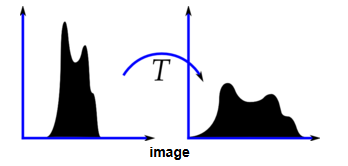

In [ ]:
file_name = 'BAND2.tif'
ds = gdal.Open(file_name)

In [ ]:
img = ds.ReadAsArray()

In [ ]:
hist,bins = np.histogram(img.flatten(),256)

In [ ]:
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

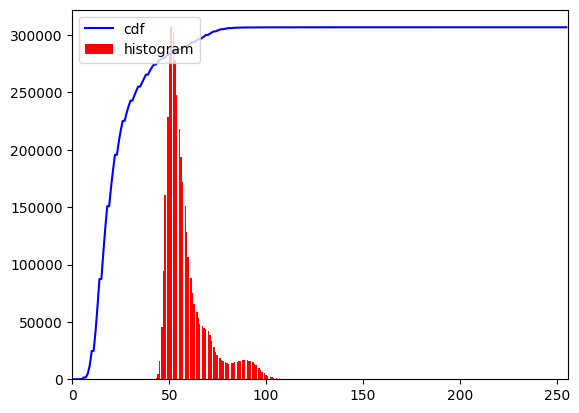

In [ ]:
plt.plot(cdf_normalized, color = 'b')
plt.hist(img.ravel(),256, color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

# Histogram Equalisation Formula

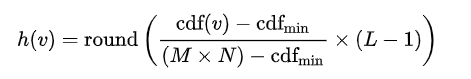

In [ ]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')

In [ ]:
img2 = cdf[img]

In [ ]:
hist,bins = np.histogram(img2.flatten(),256)

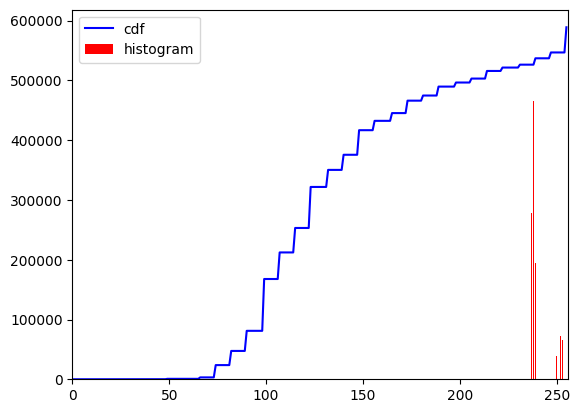

In [ ]:
hist,bins = np.histogram(img2.flatten(),256)

cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(img2.flatten(),256, color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

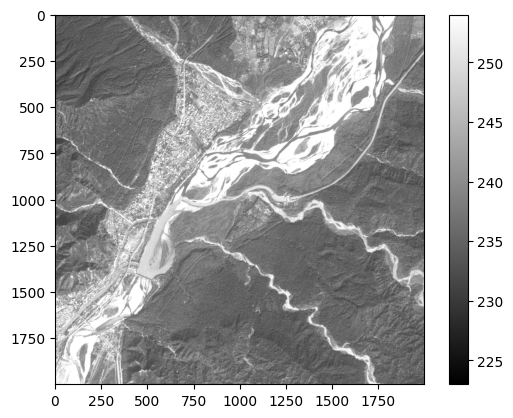

In [ ]:
plt.imshow(img2, cmap='gray')
plt.colorbar()

# Spatial Filtering

The name filter is borrowed from frequency domain processing where “filtering” refers to passing, modifying, or rejecting specified frequency components of an image. For example, a filter that passes low frequencies is called a lowpass filter. The net effect produced by a lowpass filter is to smooth an image by blurring it. We can accomplish similar smoothing directly on the image
itself by using spatial filters.

Spatial filtering modifies an image by replacing the value of each pixel by a function of the values of the pixel and its neighbors. If the operation performed on the image pixels is linear, then the filter is called a linear spatial filter. Otherwise, the filter is a nonlinear spatial filter.

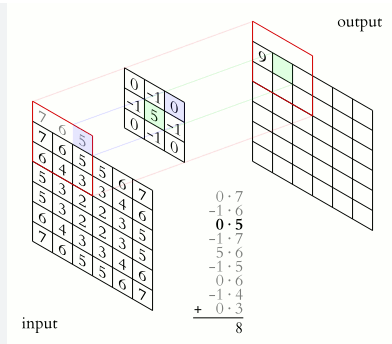

# Smoothening Spatial Filters

Smoothing (also called averaging) spatial filters are used to reduce sharp transitions in intensity. Because random noise typically consists of sharp transitions in intensity, an obvious application of smoothing is noise reduction.

Spatial filtering consists of convolving an
image with a filter kernel. Convolving a smoothing kernel with an image blurs the image, with the degree of blurring being determined by the size of the kernel and the values of its coefficients. In addition to being useful in countless applications of image processing, lowpass filters are fundamental, in the sense that other important filters, including sharpening (highpass), bandpass, and bandreject filters, can be derived from lowpass filters

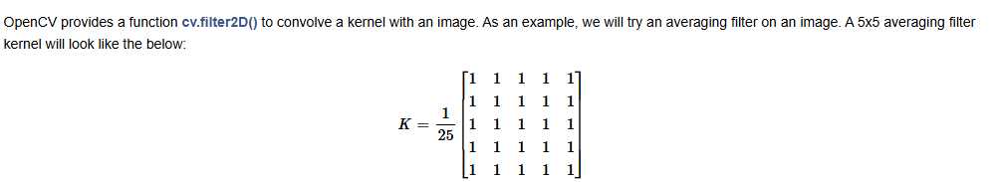

In [ ]:
data = cv.imread('/content/drive/MyDrive/DLP_Data/noisy_image.jpg')
#data = cv.cvtColor(data, cv.COLOR_BGR2RGB)

In [ ]:
kernel = np.ones((5,5),np.float32)/25
blur = cv.filter2D(data,-1,kernel)

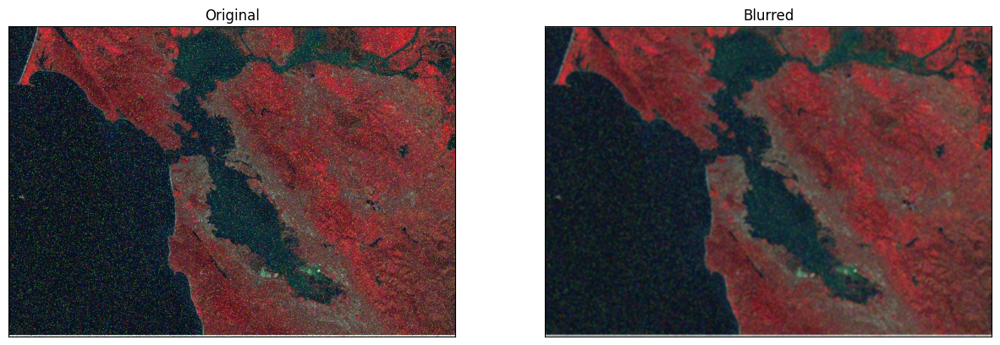

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
plt.subplot(121),plt.imshow(data)
plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122)
plt.imshow(blur)
plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

# Gaussian Blurring

In this method, instead of a box filter, a Gaussian kernel is used. It is done with the function, cv.GaussianBlur(). We should specify the width and height of the kernel which should be positive and odd. We also should specify the standard deviation in the X and Y directions, sigmaX and sigmaY respectively. If only sigmaX is specified, sigmaY is taken as the same as sigmaX. If both are given as zeros, they are calculated from the kernel size. Gaussian blurring is highly effective in removing Gaussian noise from an image.

In [ ]:
blur = cv.GaussianBlur(data,(5,5),0)

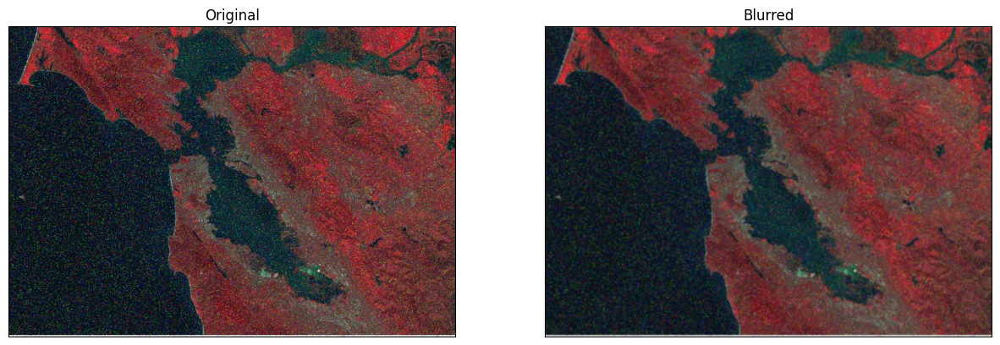

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
plt.subplot(121),plt.imshow(data)
plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122)
plt.imshow(blur)
plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

# Median Blurring

the function cv.medianBlur() takes the median of all the pixels under the kernel area and the central element is replaced with this median value. This is highly effective against salt-and-pepper noise in an image. Interestingly, in the above filters, the central element is a newly calculated value which may be a pixel value in the image or a new value. But in median blurring, the central element is always replaced by some pixel value in the image. It reduces the noise effectively. Its kernel size should be a positive odd integer.

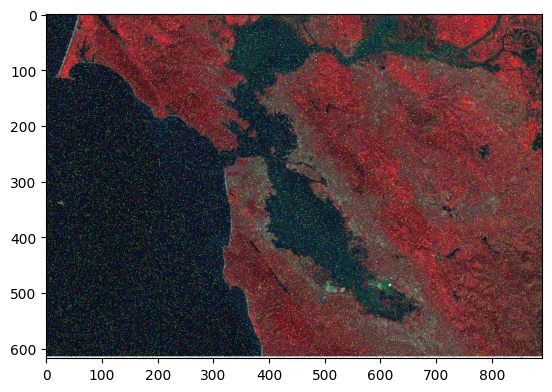

In [ ]:
plt.imshow(data)

In [ ]:
median = cv.medianBlur(data,11)

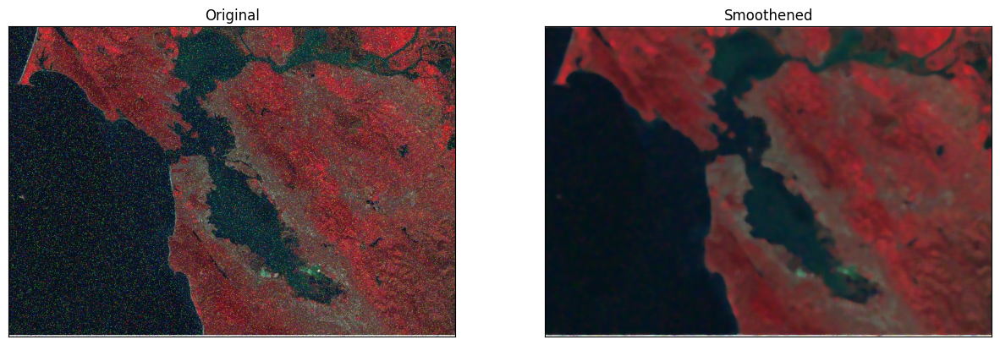

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
plt.subplot(121),plt.imshow(data)
plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122)
plt.imshow(median)
plt.title('Smoothened')
plt.xticks([]), plt.yticks([])
plt.show()

# Thank You